In [1]:
# http://www.wikihow.com/Install-FFmpeg-on-Windows

In [2]:
import numpy as np
import matplotlib
matplotlib.use("agg")
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.animation as animation

import fnmatch
import os

from IPython.display import clear_output

from nptdms import TdmsFile # this library contains the actual TDMS loading parts
#from ipywidgets import interact

In [3]:
wdir = '.' # set the open file dialog directory to the notebook directory
def openFileDialog(wdir):
    from PyQt5.QtWidgets import QApplication,QFileDialog
    app = QApplication([dir])
    files = QFileDialog.getOpenFileNames(None, "Select Files...", wdir, filter="All Files (*)")
    return files[0]

def loadTDMS(file):
    global exposure, dimx, dimy
    tdms_file = TdmsFile(file)
    p=tdms_file.object().properties
    print(p)
    print(tdms_file.objects)
    dimx=int(p['dimx'])  
    dimy=int(p['dimy'])
    
    frames=int(int(p['dimz'])/nth)
    
    exposure=float(p['exposure'])
    images=tdms_file.channel_data('Image','Image')
    #print('frames',frames)
    #print('dimx',dimx)
    #print('dimx_2',int(np.sqrt(len(images)/frames)))
    frames = int(len(images)/dimx**2)
    if dimx ==1:
        dimx = int(np.sqrt(len(images)/frames))
        dimy = dimx
    
    return images.reshape(frames,dimx,dimy)

Progress1: File  106  of  106
Progress2: 96 %


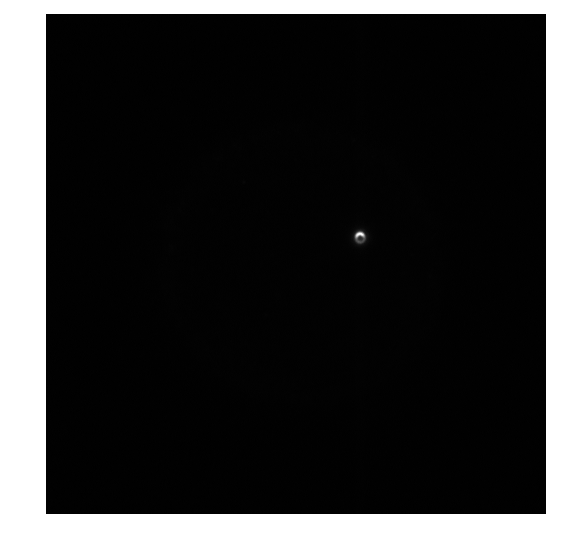

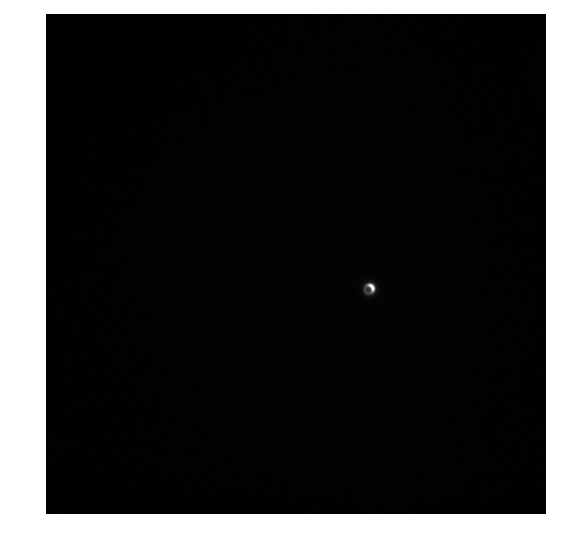

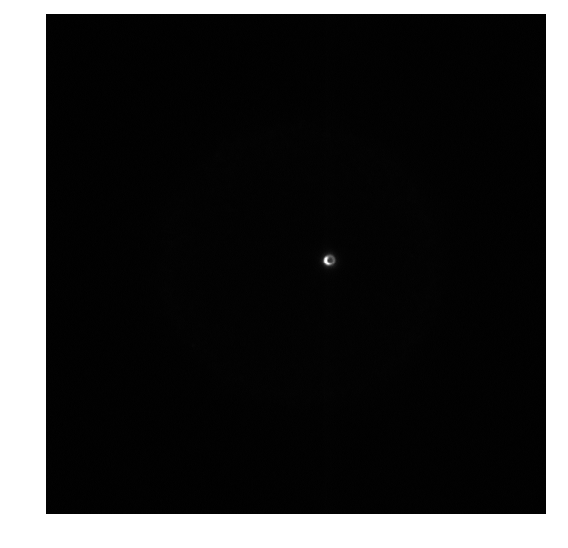

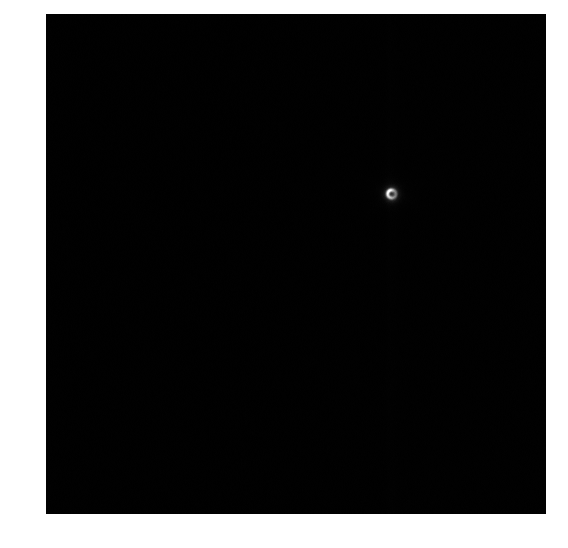

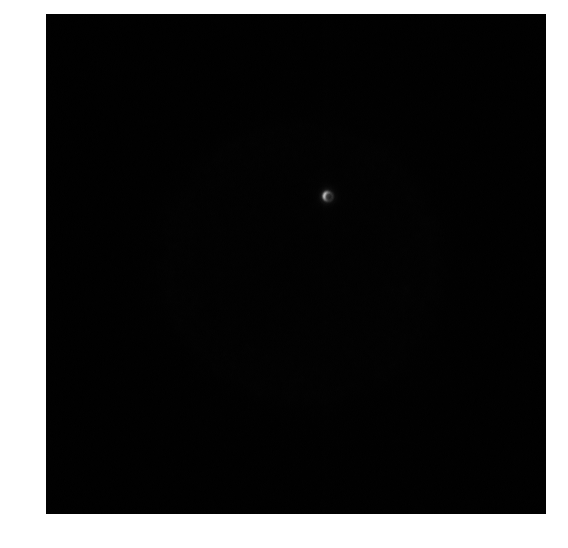

...

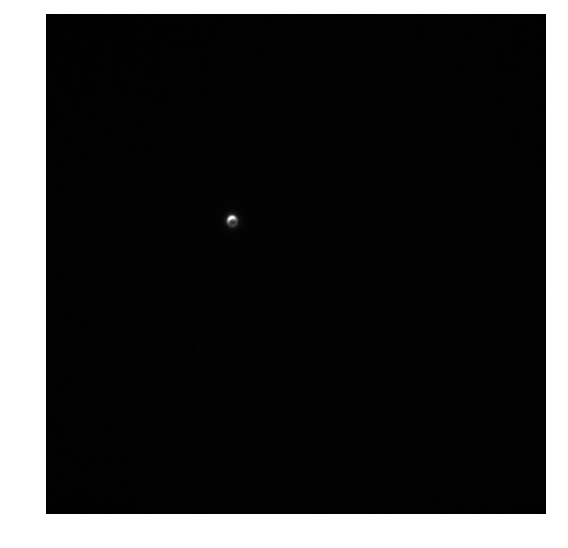

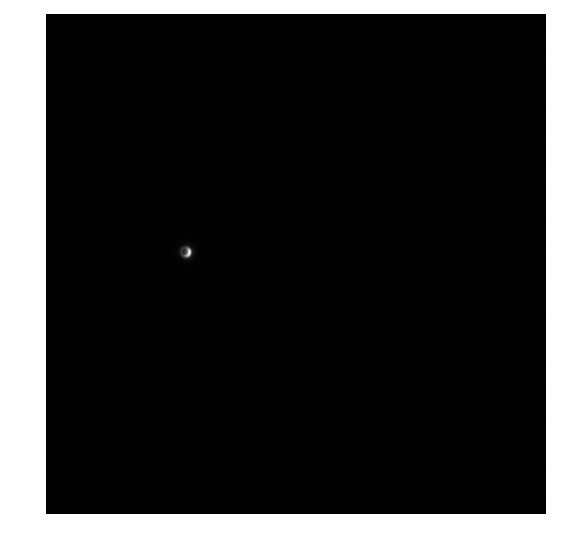

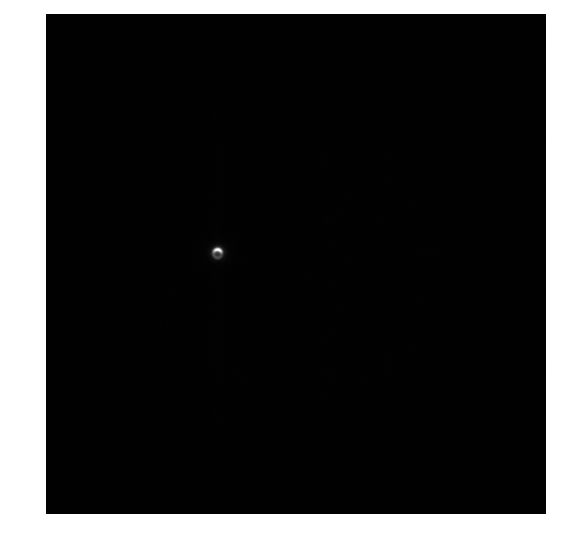

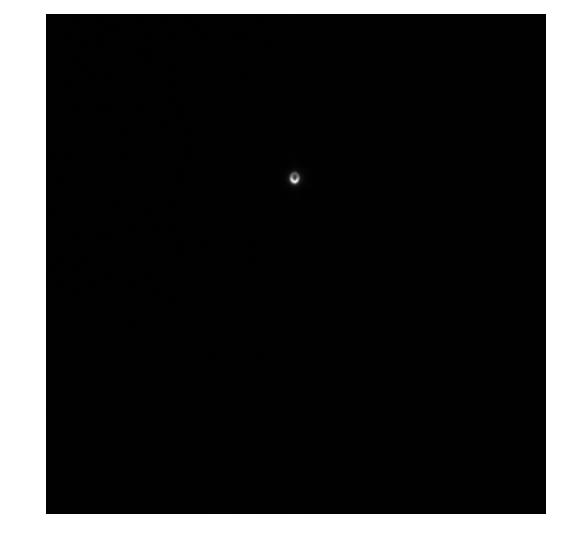

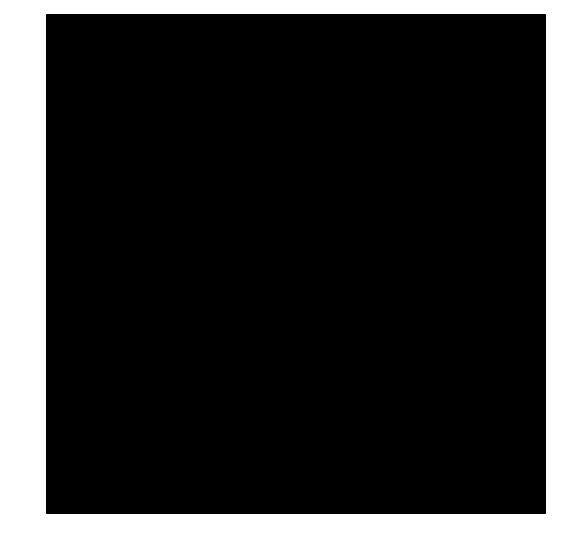

In [4]:
######### ohter binsizes dont work yet!!!!
from copy import deepcopy
all_files = openFileDialog(wdir)
files = []
nth = 1
for file in all_files: # make the relevant file list
    if fnmatch.fnmatch(file,'*_movie.tdms'):
        files.append(file)
for file_number in range(len(files)):
    file = files[file_number]
    print(file)
    images = np.zeros(0)
    if fnmatch.fnmatch(file,'*_movie.tdms'):
        images = loadTDMS(file)
        #wdir=os.path.dirname(files[0])  # set the open file dialog directory to the working directory
        ffmpegWriter = animation.writers['ffmpeg']
        writer = ffmpegWriter(fps=1./exposure/nth,codec="libx264",bitrate=-1) # + ".mp4"
        fig = plt.figure(figsize=(5, 5), dpi=100)
        fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=None, hspace=None)
        
        #from copy import deepcopy
        #images2 = deepcopy(images)
        #images2[images<0] = 0
        #images2[images>1000] = 1000
        
        im = plt.imshow(images[0], cmap='gray') # vmax=...  ,vmin = 100,vmax = 200
        #im = plt.imshow(np.log(images[0]+1), cmap='gray')
        plt.axis('off')
        #plt.colorbar() # does not look good...
        #break
        #with writer.saving(fig, file +  ".mp4",dpi = 200):
        #with writer.saving(fig, file + '_TH1000' +   ".mp4",dpi = 200):
        with writer.saving(fig, file  +   ".mp4",dpi = 200):
            for i in range(images.shape[0]):
                im.set_data(images[i])
                #im.set_data(np.log(images[i]+1))
                writer.grab_frame()
                if (i % 10 == 0):
                    clear_output(wait=True)
                    print('Progress1: File ',int(file_number)+1,' of ',int(len(files)))
                    print('Progress2:', int(i/images.shape[0]*100), '%')


In [ ]:
plt.figure()
plt.hist(images.flatten(),bins=200,range=(300,16000))
#plt.semilogx()
plt.show()

In [ ]:
plt.hist?

In [ ]:
file

In [ ]:
np.save('11_active_JPs_WF150pxl_PN140pxl_single_image',images[0])

In [ ]:
file

In [ ]:
images.shape

In [ ]:
#images = np.log(images) #for a log scale
from copy import deepcopy
fig = plt.figure(dpi = 300)
ax = fig.add_subplot(1, 1, 1)
images2 = deepcopy(images)
images2[images2<0] = 0
images2[images2>400] = 400
ax.imshow(images2[0],cmap='gray')
#ax.text(0.8, 0.95,'upper layer',
#        horizontalalignment='center',
#        verticalalignment='center',
#        transform = ax.transAxes,fontsize = 12, color = 'w')
#ax.text(0.8, 0.85,'logscale',
#        horizontalalignment='center',
#        verticalalignment='center',
#        transform = ax.transAxes,fontsize = 12, color = 'w')
ax.axis('off')
#plt.savefig('//192.168.131.72/mona/Data/Nic/Messdaten/08112017_JP_up_or_down/two_JP_AU_Slides_for_direction_determination_002_movie')
plt.show()


#plt.figure(dpi = 300)
#images = np.log(images) #for a log scale
#plt.imshow(images[0],cmap='gray')
#plt.colorbar()
#plt.axis('off')
#plt.savefig('//192.168.131.72/mona/Data/Nic/Messdaten/08112017_JP_up_or_down/two_JP_AU_Slides_for_direction_determination_001_movie_logscale')
#plt.show()

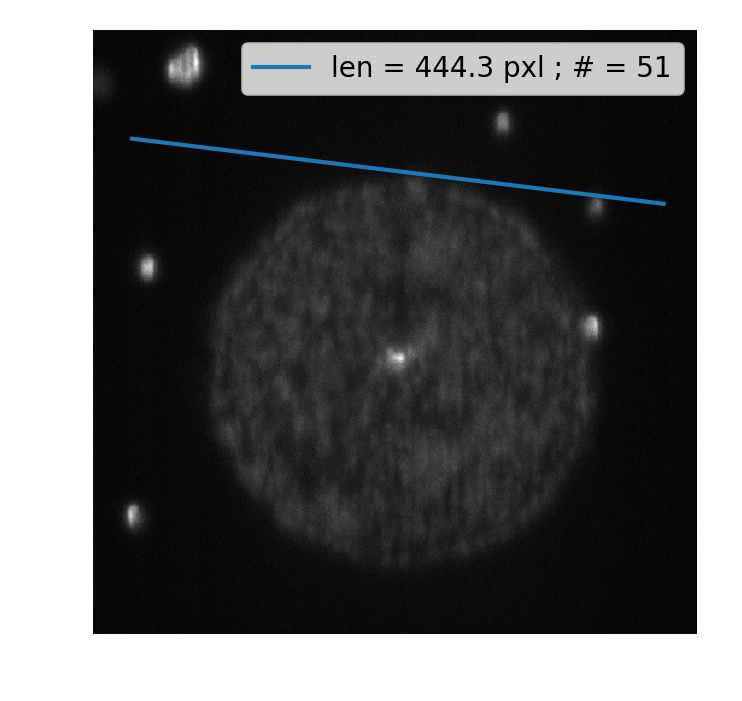

<function __main__.plot_frame_withTH>

In [5]:
#images = np.log(images) #for a log scale
dim = len(images[0])
from ipywidgets import interact
def plot_frame_withTH(i,x1,y1,x2,y2,N):
    x1=float(x1)
    x2=float(x2)
    y1=float(y1)
    y2=float(y2)
    from copy import deepcopy
    fig = plt.figure(dpi = 200)
    
    ax = fig.add_subplot(1, 1, 1)
    images2 = deepcopy(images)
    images2[images2<0] = 0
    images2[images2>15000] = 15000
    ax.imshow(images2[i],cmap='gray')
    ax.plot([x1,x2],[y1,y2],label='len = '+str(format(np.sqrt((x1-x2)**2+(y1-y2)**2),'.1f')) + ' pxl ; # = ' + N)
    plt.legend()
    ax.axis('off')
    plt.savefig('x_calib_new_camera_1040nmPS.pdf')
    plt.show()
interact(plot_frame_withTH,i = (0,len(images)),x1='32',y1='90',x2='473',y2='144',N='51')

In [6]:
1.04*51/444.29

0.11938148506606044

In [7]:
######### ohter binsizes dont work yet!!!!
from copy import deepcopy
all_files = openFileDialog(wdir)
files = []
nth = 1
for file in all_files: # make the relevant file list
    if fnmatch.fnmatch(file,'*_movie.tdms'):
        files.append(file)

In [6]:
## combine the mp4s
from moviepy.editor import VideoFileClip, concatenate_videoclips
# get the folder of the first proccesd tdms
place = 0
for i in range(len(files[0])):
    if files[0][-i] == '/' and place ==0:
        place = i
        break
folder = files[0][0:place]
movielist = []
for i in range(len(files)):
    if i in [0,41-27,44-27,47-27,66-27]:
        movielist.append(VideoFileClip(files[i] + ".mp4"))
final_clip = concatenate_videoclips(movielist)
final_clip.write_videofile(folder + "whole_video.mp4")

[MoviePy] >>>> Building video whole_video.mp4
[MoviePy] Writing video whole_video.mp4


100%|█████████████████████████████████████████████████████████████████████████████| 1500/1500 [00:14<00:00, 103.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: whole_video.mp4 



In [ ]:
folder

In [ ]:
######### ohter binsizes dont work yet!!!!
### log scale!!!
from copy import deepcopy
all_files = openFileDialog(wdir)
files = []
for file in all_files: # make the relevent file list
    if fnmatch.fnmatch(file,'*_movie.tdms'):
        files.append(file)
for file_number in range(len(files)):
    file = files[file_number]
    print(file)
    images = np.zeros(0)
    if fnmatch.fnmatch(file,'*_movie.tdms'):
        images = loadTDMS(file)
        #wdir=os.path.dirname(files[0])  # set the open file dialog directory to the working directory
        ffmpegWriter = animation.writers['ffmpeg']
        writer = ffmpegWriter(fps=1./exposure) # + ".mp4"
        fig = plt.figure(figsize=(5, 5), dpi=100)
        fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=None, hspace=None)
        #images_new = np.log(images) #for a log scale
        im = plt.imshow(np.log(images[0]), cmap='gray') # vmax=...
        plt.axis('off')
        #break
        with writer.saving(fig, file + '_logsacle' + ".mp4", dpi=100):
            for i in range(images.shape[0]):
                image_new = deepcopy(images[i])
                image_new = np.log(image_new)
                im.set_data(image_new)
                writer.grab_frame()
                if (i % 10 == 0):
                    clear_output(wait=True)
                    print('Progress1: File ',int(file_number)+1,' of ',int(len(files)))
                    print('Progress2:', int(i/images.shape[0]*100), '%')       

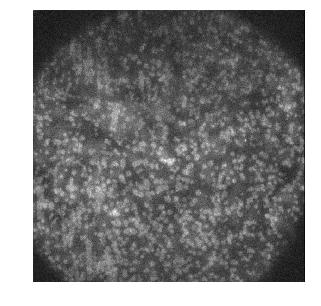

In [41]:
from copy import deepcopy
from matplotlib_scalebar.scalebar import ScaleBar
plt.figure(figsize=(5, 5))
new_image = deepcopy(images[335])
#new_image[new_image < 1000] = 0
#new_image[new_image >= 1000]= 1
plt.imshow(new_image, cmap='gray',interpolation='none')
plt.axis('off')
plt.savefig('Pluronic_af.pdf')
plt.show()

In [45]:
np.sqrt(0.44/1)

0.6633249580710799

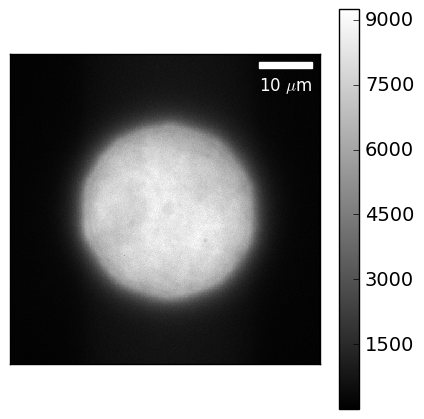

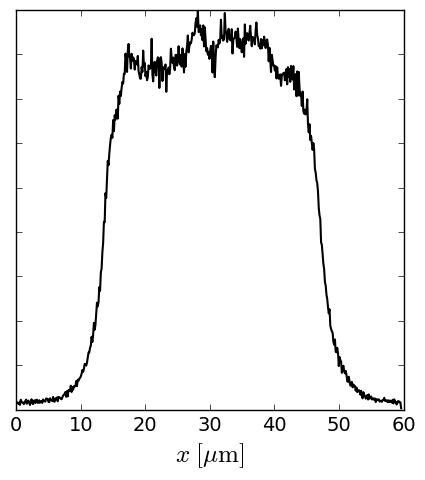

In [8]:

from matplotlib import ticker
from matplotlib_scalebar.scalebar import ScaleBar
from copy import deepcopy
new_image = deepcopy(images[0])
fig = plt.figure(figsize = (5,5))
plt.style.use('classic')
fig.patch.set_facecolor('white')
plt.style.use('presentation') 
#plt.rc('font', **{'family': 'serif', 'serif': ['Helvetica'],'size':16})
#plt.rc('text', usetex=True)
ax = fig.add_subplot(1, 1, 1)
ax.cla()

im = ax.imshow(new_image, cmap='gray',interpolation='none')
scalebar = ScaleBar(0.117,frameon=False,color = 'white',units = 'um',height_fraction = 0.02,pad = 0.3) # 1 pixel = 0.2 meter
plt.gca().add_artist(scalebar)
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
cb = plt.colorbar(im)
#cb.set_label('flourecent intensity in arbit. units')
tick_locator = ticker.MaxNLocator(nbins=8)
cb.locator = tick_locator
cb.update_ticks()


plt.savefig('WF_illu.pdf')
plt.show()

fig = plt.figure(figsize = (5,5))
fig.patch.set_facecolor('white')
#plt.rc('font', **{'family': 'serif', 'serif': ['Helvetica'],'size':16})
#plt.rc('text', usetex=True)
ax = fig.add_subplot(1, 1, 1)
ax.set_xlabel('$x\;\mathrm{[\mu m]}$')
#ax.get_yaxis().set_visible(False)
ax.set_yticklabels([])
#loc = plticker.MultipleLocator(base=1.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)


ax.plot(np.linspace(0,len(new_image)*0.119,len(new_image)),new_image[len(new_image)//2],color = 'k')
plt.savefig('WF_illu_quer.pdf')
plt.show()


In [ ]:
ScaleBar?

In [ ]:
files = openFileDialog(wdir)
images = np.zeros(0)
for file in files:
    if fnmatch.fnmatch(file,'*_movie.tdms'):
        if images.size == 0:
            images = loadTDMS(file)
        else:
            images = np.concatenate((images,loadTDMS(file)), axis=0)
        print(file)
wdir=os.path.dirname(files[0])  # set the open file dialog directory to the working directory
print(images.shape)

In [ ]:
ffmpegWriter = animation.writers['ffmpeg']
#writer = ffmpegWriter(fps=1./exposure,codec="msvideo1") # + ".avi" for PowerPoint 2010
writer = ffmpegWriter(fps=1./exposure) # + ".mp4"

fig = plt.figure(figsize=(5, 5), dpi=100)
fig.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=None, hspace=None)
im = plt.imshow(images[0], cmap='gray') # vmax=...
plt.axis('off')

with writer.saving(fig, files[0] + ".mp4", dpi=100):
    for i in range(images.shape[0]):
        im.set_data(images[i])
        writer.grab_frame()
        if (i % 10 == 0):
            clear_output(wait=True)
            print('Progress1: File ',int(file_number),' of ',int(len(files)))
            print('Progress2:', int(i/images.shape[0]*100), '%')
